<a href="https://colab.research.google.com/github/chho-work/AOI/blob/master/nb/AOI_Detectron2_MaskRCNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Train Custom Datasets in Detectron2
Model: 
Dataset: 

Contents

### Setup
* Reminder: check at the end of setup if restart is needed.


In [4]:
# GPU availability
!nvidia-smi

Wed Oct 14 07:26:10 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.23.05    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P8     9W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [1]:
# install dependencies: 
# opencv is pre-installed on colab
# !pip install cython pyyaml==5.1 pycocotools>=2.0.1
# !pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

# !gcc --version

In [2]:
# install detectron2: (Colab has CUDA 10.1 + torch 1.6)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
import torch
# assert torch.__version__.startswith("1.6")
# !pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

### Import Required Library
* Detectron2 APIs information are at the end of the notebook.


In [ ]:
# Pytorch
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

In [3]:
# detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# detectron2 utilities
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.data import MetadataCatalog, DatasetCatalog, build_detection_test_loader
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.utils.visualizer import Visualizer, ColorMode

# other libraries
import cv2
from google.colab.patches import cv2_imshow # use cv2_imshow instead of cv2.imshow
import glob
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import time

### Download Dataset
* AOI datasets train, val, test images and corresponding annotations are available in data dir.
* Strongly recommend to prepare your data in COCO format.

### Register AOI Dataset and Add Metadata
* More information on registering custom datasets: https://detectron2.readthedocs.io/tutorials/datasets.html#register-a-dataset

In [4]:
# Use register_coco_instances() to register AOI datasets(already in COCO format).
# Three sets of images are registered: train, validation and test. 
register_coco_instances("AOI_train", {}, "./data/annotation/train.json", "./data/train")
register_coco_instances("AOI_val", {}, "./data/annotation/val.json", "./data/val")
register_coco_instances("AOI_test", {}, "./data/annotation/test.json", './data/test')

In [5]:
# MetadataCatalog is a key-value mapping which contains names of classes, colors of classes, root of files, etc. 
AOI_train_metadata = MetadataCatalog.get("AOI_train")
AOI_val_metadata = MetadataCatalog.get("AOI_val")
AOI_test_metadata = MetadataCatalog.get("AOI_test")

# A global dictionary which contains information about the datasets.
# It also makes it easier to choose different datasets, by just using the strings in the config.
dataset_dicts_train = DatasetCatalog.get("AOI_train")
dataset_dicts_val = DatasetCatalog.get("AOI_val")
dataset_dicts_test = DatasetCatalog.get("AOI_test")

WARNING [10/14 07:31:28 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/14 07:31:28 d2.data.datasets.coco]: Loaded 96 images in COCO format from ./data/annotation/train.json
WARNING [10/14 07:31:28 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/14 07:31:28 d2.data.datasets.coco]: Loaded 21 images in COCO format from ./data/annotation/val.json
WARNING [10/14 07:31:28 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/14 07:31:28 d2.data.datasets.coco]: Loaded 9 images in COCO format from ./data/annotation/test.json


In [13]:
print(AOI_train_metadata)
print(AOI_test_metadata)
print(AOI_test_metadata)

Metadata(evaluator_type='coco', image_root='./data/train', json_file='./data/annotation/train.json', name='AOI_train', thing_classes=['capacitor', 'resistor', 'background'], thing_dataset_id_to_contiguous_id={0: 0, 1: 1, 2: 2})
Metadata(evaluator_type='coco', image_root='./data/test', json_file='./data/annotation/test.json', name='AOI_test', thing_classes=['capacitor', 'resistor', 'background'], thing_dataset_id_to_contiguous_id={0: 0, 1: 1, 2: 2})
Metadata(evaluator_type='coco', image_root='./data/test', json_file='./data/annotation/test.json', name='AOI_test', thing_classes=['capacitor', 'resistor', 'background'], thing_dataset_id_to_contiguous_id={0: 0, 1: 1, 2: 2})


### Visualize Images
* Randomly select images with annotation and verify the data loading is correct.


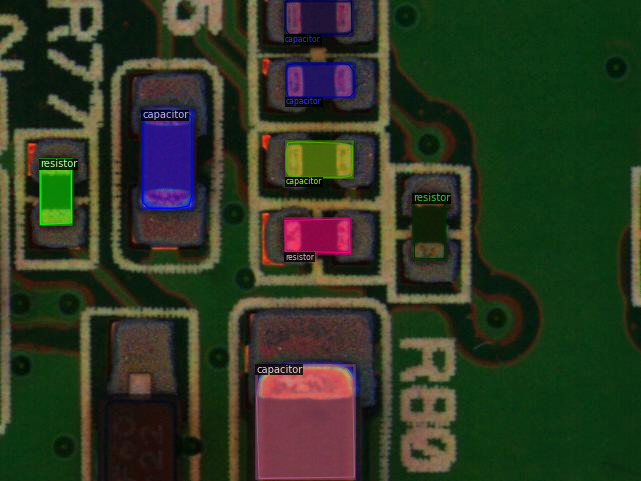

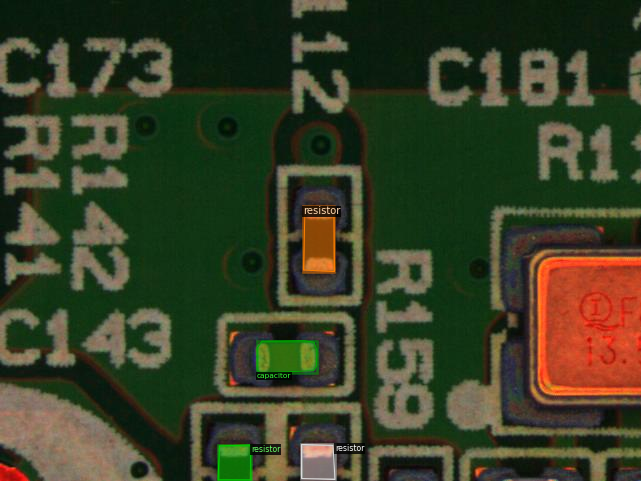

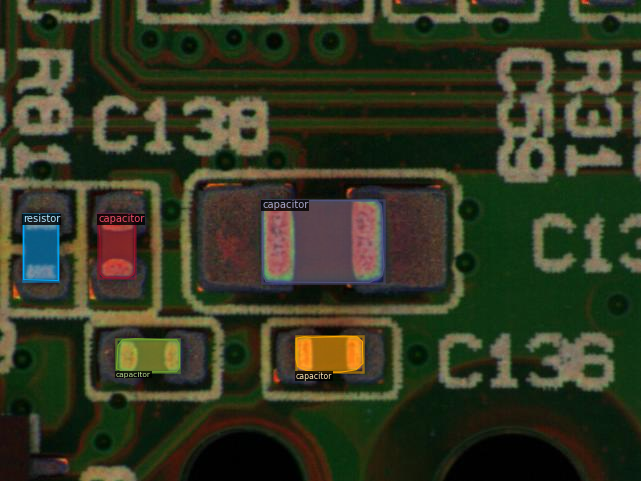

In [6]:
for d in random.sample(dataset_dicts_train, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=AOI_train_metadata, scale=1.0)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])
    print('\n')

### Train

In [7]:
# COCOEvaluator enables evaluation of:
# AP (Average Precision) for box detection, instance segmentation, keypoint detection on any custom dataset,
#  using dataset's official API.

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [8]:
# Obtain detectron2's default config
cfg = get_cfg() 

# Load values from a file
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))

# Add new configs custom components
cfg.DATASETS.TRAIN = ("AOI_train",) # training images; remember to add ",", dtype: tuple
cfg.DATASETS.TEST = ("AOI_val",) # validation images; remember to add ",", dtype: tuple
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # initialize from model zoo
#cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"
cfg.SOLVER.IMS_PER_BATCH = 2 # images per batch
cfg.SOLVER.BASE_LR = 0.02 # mininum learning rate

cfg.SOLVER.WARMUP_ITERS = 1000 # ??
cfg.SOLVER.MAX_ITER = 1500    
cfg.SOLVER.STEPS = (1000, 1500) #??

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 164 #??   
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3  # 2 classes (capacitor, resistor) + 1 (background)

cfg.TEST.EVAL_PERIOD = 100 # ??

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False) # ??
trainer.train() # Training 

[10/14 07:32:43 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:02, 87.3MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (12, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (12,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to

[10/14 07:32:50 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.6/dist-packages/detectron2/structures/masks.py:331: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  item = item.nonzero().squeeze(1).cpu().numpy().tolist()
/usr/local/lib/python3.6/dist-packages/detectron2/structures/masks.py:331: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  item = item.nonzero().squeeze(1).cpu().numpy().tolist()
/usr/local/lib/python3.6/dist-packages/detectron2/structures/masks.py:331: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python

[10/14 07:32:59 d2.utils.events]:  eta: 0:10:32  iter: 19  total_loss: 2.396  loss_cls: 0.961  loss_box_reg: 0.720  loss_mask: 0.635  loss_rpn_cls: 0.026  loss_rpn_loc: 0.027  time: 0.4266  data_time: 0.0257  lr: 0.000400  max_mem: 2342M
[10/14 07:33:08 d2.utils.events]:  eta: 0:10:29  iter: 39  total_loss: 1.681  loss_cls: 0.490  loss_box_reg: 0.778  loss_mask: 0.383  loss_rpn_cls: 0.017  loss_rpn_loc: 0.018  time: 0.4276  data_time: 0.0057  lr: 0.000799  max_mem: 2342M
[10/14 07:33:16 d2.utils.events]:  eta: 0:10:19  iter: 59  total_loss: 1.106  loss_cls: 0.287  loss_box_reg: 0.644  loss_mask: 0.209  loss_rpn_cls: 0.001  loss_rpn_loc: 0.017  time: 0.4262  data_time: 0.0055  lr: 0.001199  max_mem: 2342M
[10/14 07:33:25 d2.utils.events]:  eta: 0:10:11  iter: 79  total_loss: 0.575  loss_cls: 0.129  loss_box_reg: 0.323  loss_mask: 0.114  loss_rpn_cls: 0.001  loss_rpn_loc: 0.013  time: 0.4291  data_time: 0.0051  lr: 0.001598  max_mem: 2342M
WARNING [10/14 07:33:34 d2.data.datasets.coco]: 

### Visualize Training w/Tensorboard

In [9]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [10]:
# List files in output(COCO eval) folder
%ls ./output/

events.out.tfevents.1602660764.7baef5139f0f.297.0  metrics.json
last_checkpoint                                    model_final.pth


In [11]:
# Evaluation with test images
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("AOI_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "AOI_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [10/14 07:47:22 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/14 07:47:22 d2.data.datasets.coco]: Loaded 9 images in COCO format from ./data/annotation/test.json
[10/14 07:47:22 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
| capacitor  | 25           |  resistor  | 16           | background | 0            |
|            |              |            |              |            |              |
|   total    | 41           |            |              |            |              |
[10/14 07:47:22 d2.data.common]: Serializing 9 elements to byte tensors and concatenating them all ...
[10/14 07:47:22 d2.data.common]: Serialized dataset takes 0.01 MiB
[10/14 07:47:22 d2.data.dataset_mapper]: Augmentations used in training: [Re

OrderedDict([('bbox',
              {'AP': 92.17964296429642,
               'AP-background': nan,
               'AP-capacitor': 94.25202520252026,
               'AP-resistor': 90.10726072607261,
               'AP50': 100.0,
               'AP75': 100.0,
               'APl': 100.0,
               'APm': 91.88852097284031,
               'APs': nan}),
             ('segm',
              {'AP': 93.62323196605374,
               'AP-background': nan,
               'AP-capacitor': 94.38755304101839,
               'AP-resistor': 92.85891089108911,
               'AP50': 100.0,
               'AP75': 100.0,
               'APl': 100.0,
               'APm': 93.32489498949896,
               'APs': nan})])

/content/data/test/35.jpg


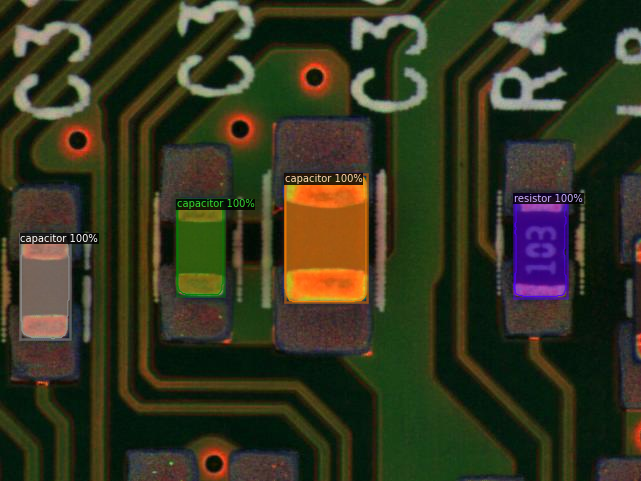



/content/data/test/21.jpg


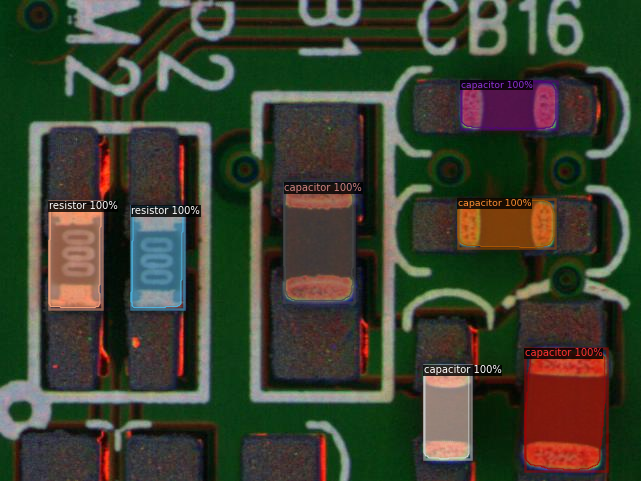



/content/data/test/73.jpg


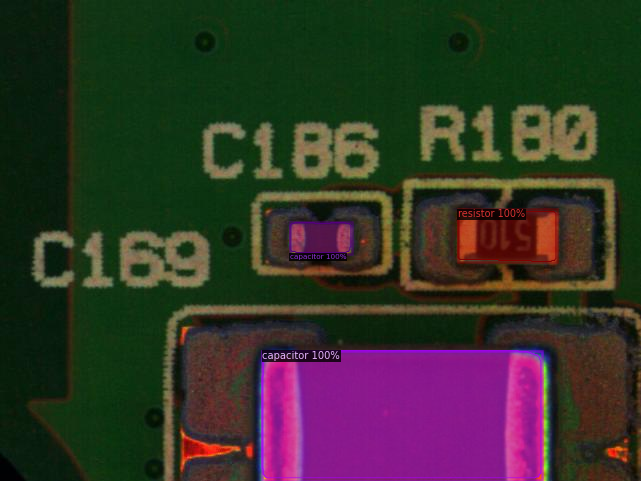



/content/data/test/34.jpg


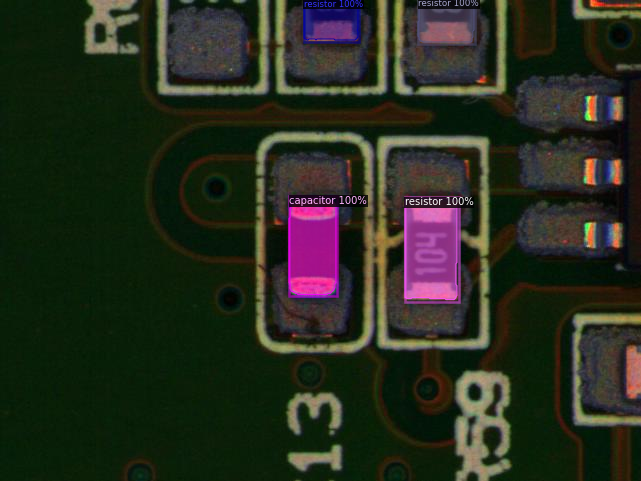



/content/data/test/71.jpg


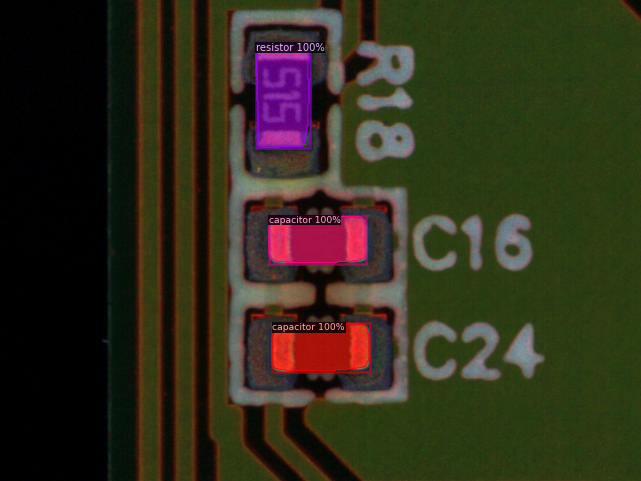



/content/data/test/24.jpg


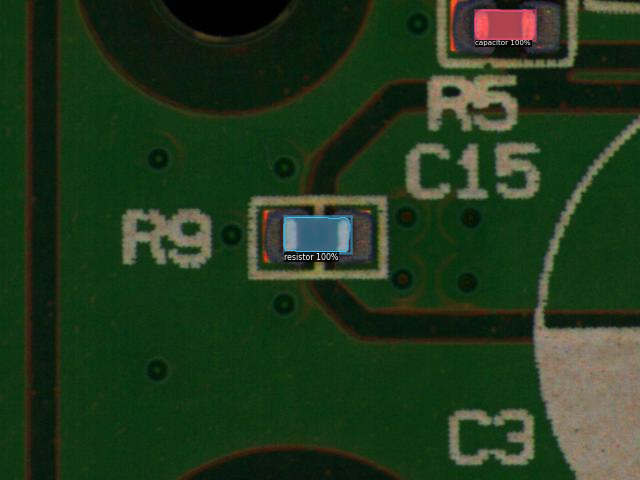



/content/data/test/72.jpg


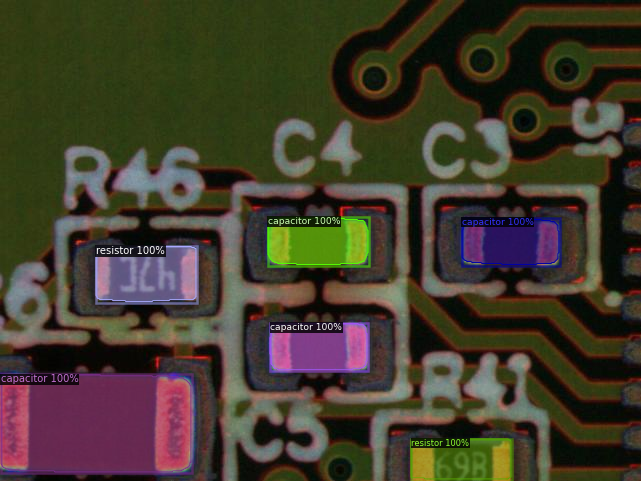



/content/data/test/74.jpg


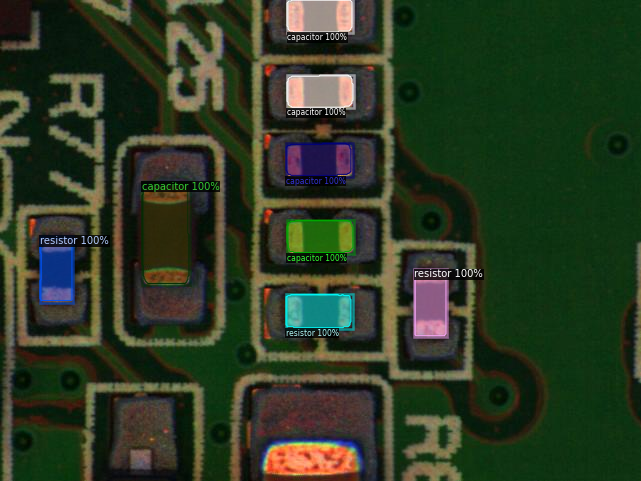



/content/data/test/23.jpg


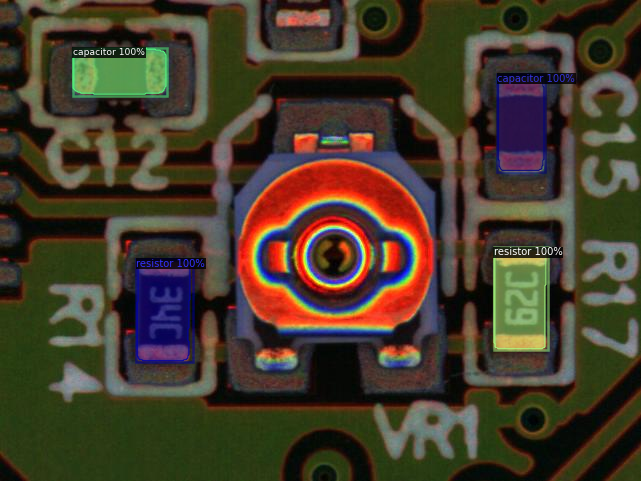

In [12]:
# Visualize prediction results with test images.
for imageName in glob.glob('/content/data/test/*.jpg'):
  print(imageName)
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=AOI_test_metadata, 
                scale=1.0
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
  print('\n')


tensor([], device='cuda:0', dtype=torch.int64)
Boxes(tensor([], device='cuda:0', size=(0, 4)))


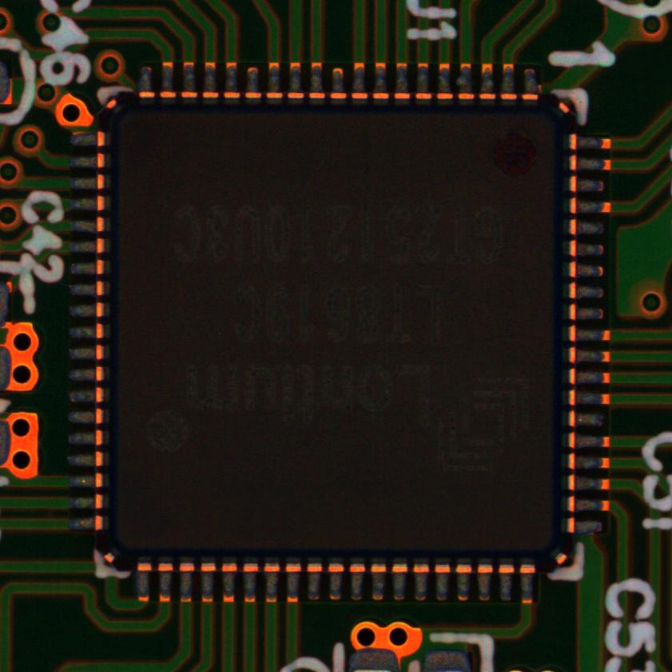

In [16]:
# Inference with images containing only background(or without capacitor and resistor).
im = cv2.imread('/content/data/background/U1_3_SolderLight.jpg')
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
outputs = predictor(im)
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]),scale=0.8)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

## Benchmark inference speed

In [ ]:

times = []
for i in range(20):
    start_time = time.time()
    outputs = predictor(im)
    delta = time.time() - start_time
    times.append(delta)
mean_delta = np.array(times).mean()
fps = 1 / mean_delta
print("Average(sec):{:.2f},fps:{:.2f}".format(mean_delta, fps))

Average(sec):0.07,fps:13.93


### Detectron2 API References:

1. [register_coco_instances(name, metadata, json_file, image_root)](https://detectron2.readthedocs.io/modules/data.html?highlight=register_coco_instances#detectron2.data.datasets.register_coco_instances)

2. [MetadataCatalog(dict)](https://detectron2.readthedocs.io/modules/data.html#detectron2.data.MetadataCatalog)

3. [DatasetCatalog(dict)](https://detectron2.readthedocs.io/modules/data.html#detectron2.data.DatasetCatalog)

4. [Visualizer(img_rgb, metadata=None, scale=1.0, instance_mode=<ColorMode.IMAGE: 0>)](https://detectron2.readthedocs.io/modules/utils.html?highlight=Visualizer#detectron2.utils.visualizer.Visualizer)

5. [COCOEvaluator(dataset_name, cfg, distributed, output_dir=None, *, use_fast_impl=True)](https://detectron2.readthedocs.io/modules/evaluation.html#detectron2.evaluation.COCOEvaluator)
    

### Config References:
https://detectron2.readthedocs.io/modules/config.html?highlight=DATASETS.TRAIN#config-references

1. _C.DATASETS.TRAIN = ( )<br>
List of the dataset names for training. Must be registered in DatasetCatalog.
2. _C.DATASETS.TEST = ( )<br>
List of the dataset names for testing. Must be registered in DatasetCatalog.
3. _C.DATALOADER.NUM_WORKERS = 4<br>
Number of data loading threads.
4. MODEL.WEIGHTS<br> 
Path (a file path, or URL like detectron2://.., https://..) to a checkpoint file to be loaded to the model. You can find available models in the model zoo.
5. SOLVER.IMS_PER_BATCH<BR>
Number of images per batch across all machines. If we have 16 GPUs and IMS_PER_BATCH = 32, each GPU will see 2 images per batch. May be adjusted automatically if REFERENCE_WORLD_SIZE is set.
6. SOLVER.BASE_LR:<br>
Set base learning rate.
7. SOLVER.WARMUP_ITERS = 1000<br>
Default warmup iterations.
8. SOLVER.MAX_ITER = 40000<br>
Maximum Detectron2 allowed iterations.
9. SOLVER.STEPS = = (30000,)<br>
The iteration number to decrease learning rate by GAMMA. 
10. MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE<br>
RoI minibatch size *per image* (number of regions of interest [ROIs])Total number of RoIs per training minibatch = ROI_HEADS.BATCH_SIZE_PER_IMAGE * SOLVER.IMS_PER_BATCH
E.g., a common configuration is: 512 * 16 = 8192
11. MODEL.ROI_HEADS.NUM_CLASSES<br>
Number of foreground classes.

### Acknowledgement:
This notebook wouldn't have been possible without the knowledge shared by:<br>

* Dlology
* Detectron2
* Roboflow
* Medium
